<a href="https://colab.research.google.com/github/carolina-garay/M_Espacios_Verdes_2022_Grupo1/blob/Garay_Carolina_TP1/Analisis_y_Visualizacion_MEV_TP_Garay_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Setup
!pip install pandas_profiling==2.8.0
!pip install pandas==1.2.0

# Mentoría: Monitoreo de Espacios Verdes -- Práctico de análisis y visualización

__DIPLODATOS 2022 - FAMAF UNC__

_GRUPO1_

Alumnos

- Artola, María Fernanda
- Garay, Carolina
- Nievas, Rafael
- Ormaechea, Sebastián


## Introducción
El empleo de imágenes satelitales se puede utilizar para determinar diversos índices de plantas tales como el área de clorofila de las hojas y los índices de contenido de agua. Esto es especialmente importante para la predicción del rendimiento efectivo y las aplicaciones relacionadas con la vegetación sobre la superficie terrestre. Particularmente podríamos establecer cuánta agua necesita una plaza, o parque, cada cierto tiempo por ejemplo. Es de particular interés determinar el crecimineto en altura del pasto de un parque y así un municipio podría establecer cuándo enviar su cuadrilla a cortarlo.

##Carga del dataset

In [151]:
# from link @ https://github.com/felixlapalma/monitoreo-espacios-verdes-diplo202X/blob/main/data/ab-initio-dataset-build.md
!gdown https://drive.google.com/file/d/1tgbIQaEXzIghcFYyd2YM9iMho4TDHHFd/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1tgbIQaEXzIghcFYyd2YM9iMho4TDHHFd
To: /content/espacios-verdes-indexs-cba-20170101-20220420.zip
100% 170M/170M [00:01<00:00, 163MB/s]


In [152]:
# Importación del módulo para ejecutar pandas profiling y descargar reporte
from pandas_profiling import ProfileReport
#from google.colab import files

In [153]:
import pandas as pd
import numpy as np

In [7]:
df=pd.read_csv('/content/espacios-verdes-indexs-cba-20170101-20220420.zip',index_col=0)


##Primera visualización del conjunto de datos.

In [156]:
print(f"Dataframe HEAD")
display(df.head())


Dataframe HEAD


,B02_min,B02_max,B02_mean,B02_median,B02_nodata,B02_range,B02_count,B03_min,B03_max,B03_mean,...,sipi_mean,sipi_median,sipi_nodata,sipi_range,sipi_count,raster,clouds_on_raster,osm_id,name,area_m2
date,,,,,,,,,,,,,,,,,,,,,
2017-01-03,0.0871,0.1421,0.102570,0.09650,0.0,0.0550,47,0.0768,0.1516,0.098885,...,0.924291,0.884216,0.0,0.453065,47,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,605976736,NaN,4650.710032
2017-01-03,0.0970,0.1936,0.118354,0.10660,0.0,0.0966,13,0.1006,0.1949,0.122154,...,0.979787,0.971875,0.0,0.247045,13,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559322368,NaN,1502.000513
2017-01-03,0.0992,0.1273,0.111805,0.11290,0.0,0.0281,19,0.1037,0.1369,0.117795,...,0.979928,0.973017,0.0,0.207006,19,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559322369,NaN,2004.192528
2017-01-03,0.0995,0.1933,0.118491,0.11355,0.0,0.0938,66,0.0993,0.1990,0.124512,...,0.983599,0.966202,0.0,0.258424,66,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559328111,NaN,6940.507640
2017-01-03,0.1059,0.1385,0.122453,0.12240,0.0,0.0326,47,0.1036,0.1580,0.132455,...,1.000021,0.993986,0.0,0.260419,47,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559328112,NaN,4587.356048


In [9]:
print(f"Dataframe TAIL")
df.tail()

Dataframe TAIL


,B02_min,B02_max,B02_mean,B02_median,B02_nodata,B02_range,B02_count,B03_min,B03_max,B03_mean,...,sipi_median,sipi_nodata,sipi_range,sipi_count,raster,clouds_on_raster,osm_id,name,area_m2,date
208927,0.0990,0.1684,0.115990,0.11270,0.0,0.0694,31,0.0862,0.1627,0.107387,...,0.892669,0.0,0.545993,31,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,307532496,NaN,3824.467794,2022-04-17
208928,0.1145,0.3240,0.149746,0.13665,0.0,0.2095,80,0.0977,0.3363,0.149332,...,1.084102,0.0,2.805242,80,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,307535460,Plaza Exodo Jujeño,7184.535857,2022-04-17
208929,0.0993,0.1388,0.110870,0.10625,0.0,0.0395,10,0.0930,0.1473,0.106160,...,0.914887,0.0,0.199024,10,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,307796387,NaN,1147.997645,2022-04-17
208930,0.0991,0.1407,0.124008,0.12570,0.0,0.0416,53,0.0852,0.1377,0.118574,...,0.991200,0.0,0.299910,53,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,307097955,NaN,5185.690046,2022-04-17
208931,0.0874,0.1347,0.104697,0.10180,0.0,0.0473,95,0.0707,0.1321,0.095941,...,0.889747,0.0,0.456241,95,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,901791744,NaN,9394.381202,2022-04-17


In [10]:
#profile = ProfileReport(df_)
#profile

In [154]:
# Obtenemos los tipos de datos por cada columna
data_types = df.dtypes
data_types = pd.DataFrame(data_types)
data_types = data_types.rename(columns = {0:'ReadingDataType'})
data_types.index.names = ['FieldName']
data_types

,ReadingDataType
FieldName,
B02_min,float64
B02_max,float64
B02_mean,float64
B02_median,float64
B02_nodata,float64
...,...
raster,object
clouds_on_raster,float64
osm_id,int64


##Variables de interés

Seleccionamos las siguientes variables:


- osm_id: Identificador asociado a la capa original (atlas-espacios-verdes).
- date: Fecha de la muestra.
- B03_median: Mediana correspondiente a la Banda 03 (color verde). 
- ndvi_max: Valor máximo correspondiente al indice NDVI.
- area_m2: Área en metros cuadrados

¿Qué _tipo de variable_ es cada una? Parecen estar acotadas? ¿Son fisicamente razonables?


In [ ]:
df[["osm_id","B03_median","date","ndvi_max","area_m2"]].dtypes

## Análisis estádistico de las variables de interés

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

In [14]:
BANDS = ["B02", "B03", "B04", "B05", "B06", "B07", "B8A", "B08", "B11", "B12"]
TEST_COLS=[f"{B}_median" for B in BANDS]
df_bandas=df.loc[:,TEST_COLS]

***Outliers***: ¿Existen _outliers_ en las variables seleccionadas? (Note que en la presentación de los datos, esto parece estar presente en casi todos los casos) 

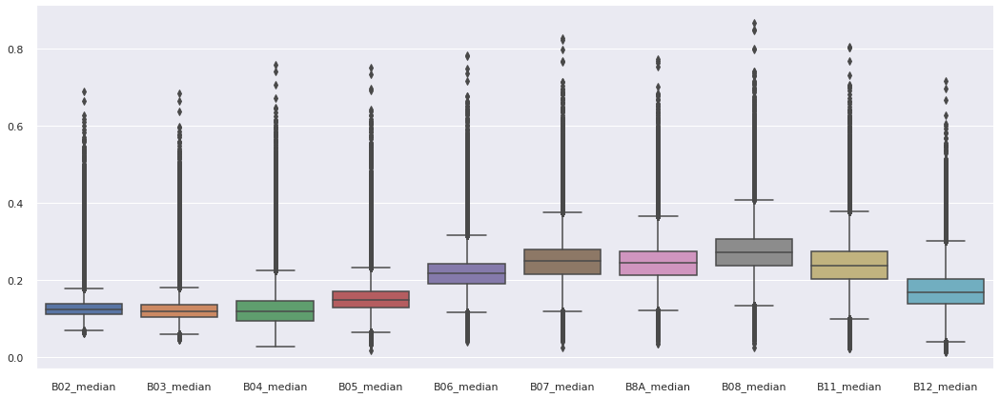

In [15]:
# Visualizamos los outliers
plt.figure(figsize=(18,7))
sns.set(font_scale = 1)
g = sns.boxplot(data=df_bandas)                  
sns.despine()

Estudiamos los outliers de la variable **area_m2**

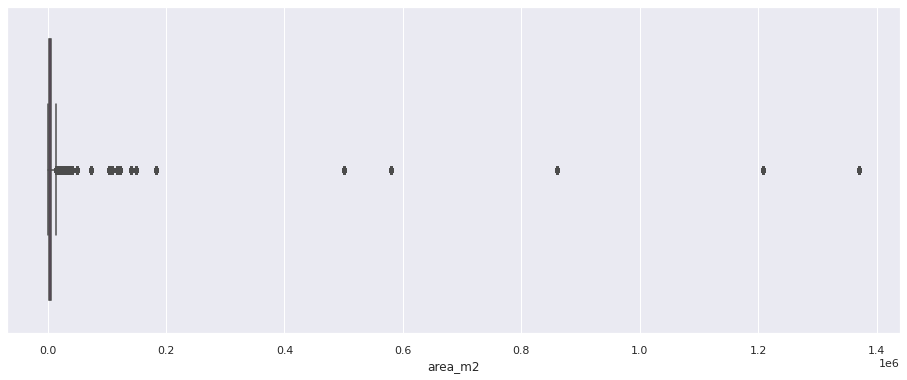

In [16]:
plt.figure(figsize=(16, 6))
sns.boxplot(x=df["area_m2"], color='magenta');


Dado que la visualización de los outliers se dificulta en el boxplot, decidimos utilizar un histograma para la visualización.

<Figure size 1440x576 with 0 Axes>

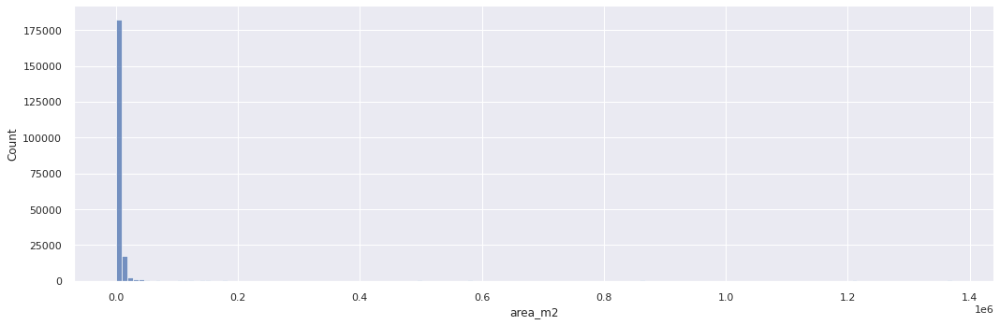

In [17]:
plt.figure(figsize=(20,8))
m=sns.displot(df["area_m2"], aspect=3, bins=150)
plt.show();

En el histograma también se dificulta la visualización de los valores de la variable **area_m2**, por lo tanto calculamos medidas de tendencia central.

In [18]:
df["area_m2"].describe().apply(lambda s: '{0:.2f}'.format(s))

count     208932.00
mean       12493.88
std        78957.30
min          422.60
25%         2066.56
50%         3812.18
75%         6644.79
max      1370630.49
Name: area_m2, dtype: object

**Valores Faltantes**: ¿Existen? ¿Es mejor descartarlos o completarlos con un valor particular? (Quizas le sirva responder la siguiente pregunta en primer lugar)

In [19]:
# Análisis estadístico de bandas mediante pandas profiling
profileBandas = ProfileReport(df_bandas)
profileBandas
#files.download('df_BandasReport.html')

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
# Análisis de las variables seleccionadas mediante pandas profiling
df_Vars=df.loc[:,["B03_median", "osm_id", "date", "ndvi_max","area_m2"]]
profileVars = ProfileReport(df_Vars)
profileVars 

#files.download('df_VarsReport.html')

Summarize dataset:   0%|          | 0/19 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Distribucion de Valores: ¿Cómo es la distribución de las variables en el dataset? ¿Se parecen a alguna distribucion que recuerde? Son todas de la misma distribución?

<Figure size 1440x576 with 0 Axes>

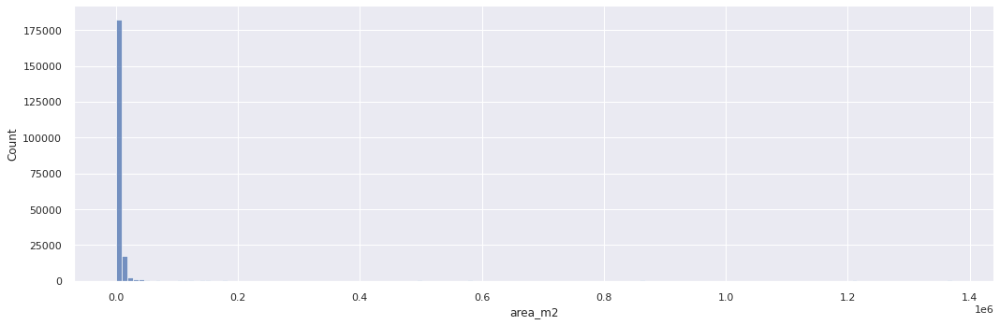

In [21]:
# Gráfica de la distribución de la variable area_m2
plt.figure(figsize=(20,8))
m=sns.displot(df["area_m2"], aspect=3, bins=150)
plt.show();

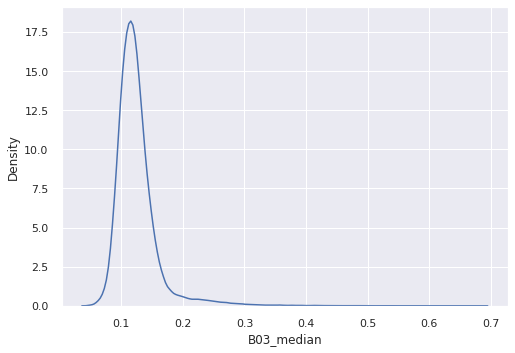

In [22]:
# Gráfica de la distribución de la variable B03_median
sns.kdeplot(df['B03_median']);

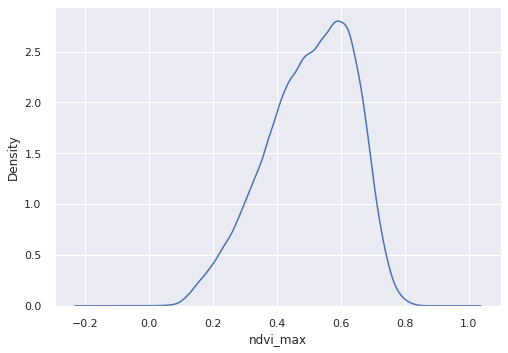

In [23]:
# Gráfica de la distribución de la variable ndvi_max
sns.kdeplot(df['ndvi_max'])

**Distribucion Condicionada**: ¿Cómo es la distribución de una variable (cualquiera que haya elegido) condicionada a la variable temporal por ejemplo? ¿Tiene sentido utilizar la dependencia temporal cuando estamos intentando completar valores faltantes?

In [ ]:
# Convertimos la columna de fecha de tipo object a datetime
from datetime import date
from datetime import datetime
df['date'] = pd.to_datetime(df['date'])
df[["B03_median", "osm_id", "date", "ndvi_max","area_m2"]].dtypes

In [93]:
df['date'].index

Int64Index([     0,      1,      2,      3,      4,      5,      6,      7,
                 8,      9,
            ...
            208922, 208923, 208924, 208925, 208926, 208927, 208928, 208929,
            208930, 208931],
           dtype='int64', length=208932)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


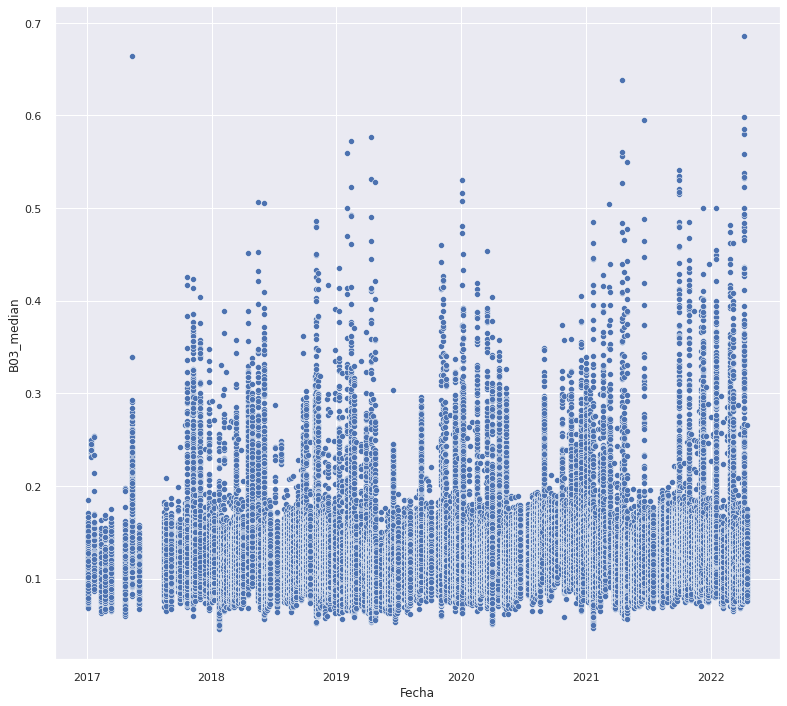

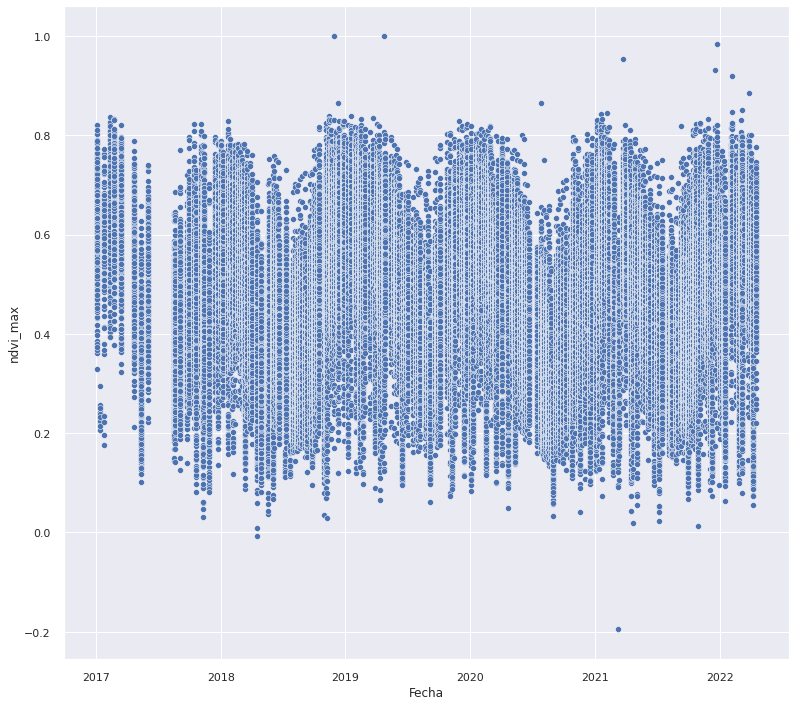

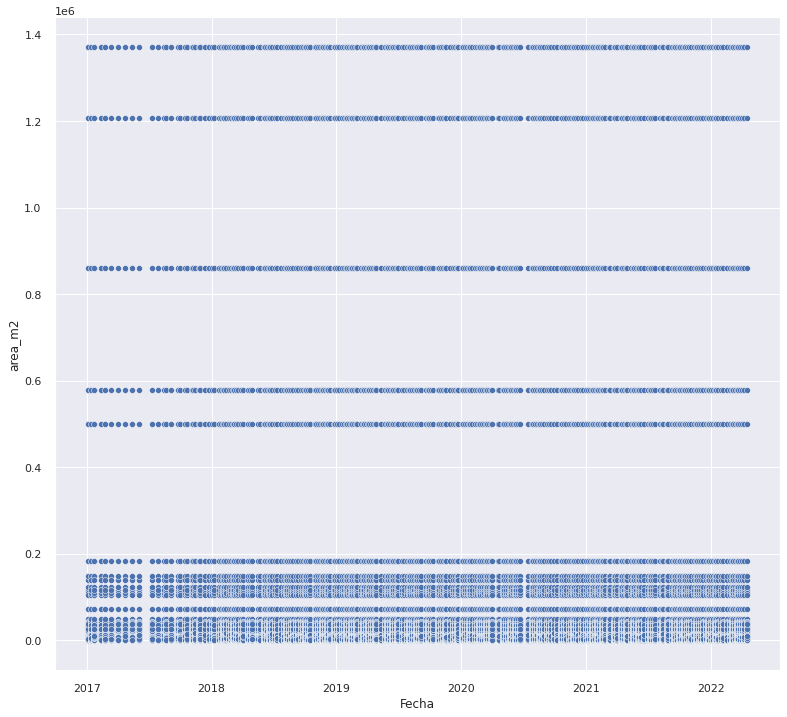

In [25]:
# Graficamos las variables seleccionadas en función del tiempo
plt.figure(figsize=(13, 12))
sns.scatterplot(df['date'], df['B03_median'])
plt.xlabel("Fecha")
plt.ylabel("B03_median")

plt.figure(figsize=(13, 12))
sns.scatterplot(df['date'], df['ndvi_max'])
plt.xlabel("Fecha")
plt.ylabel("ndvi_max")

plt.figure(figsize=(13, 12))
sns.scatterplot(df['date'], df['area_m2'])
plt.xlabel("Fecha")
plt.ylabel("area_m2");

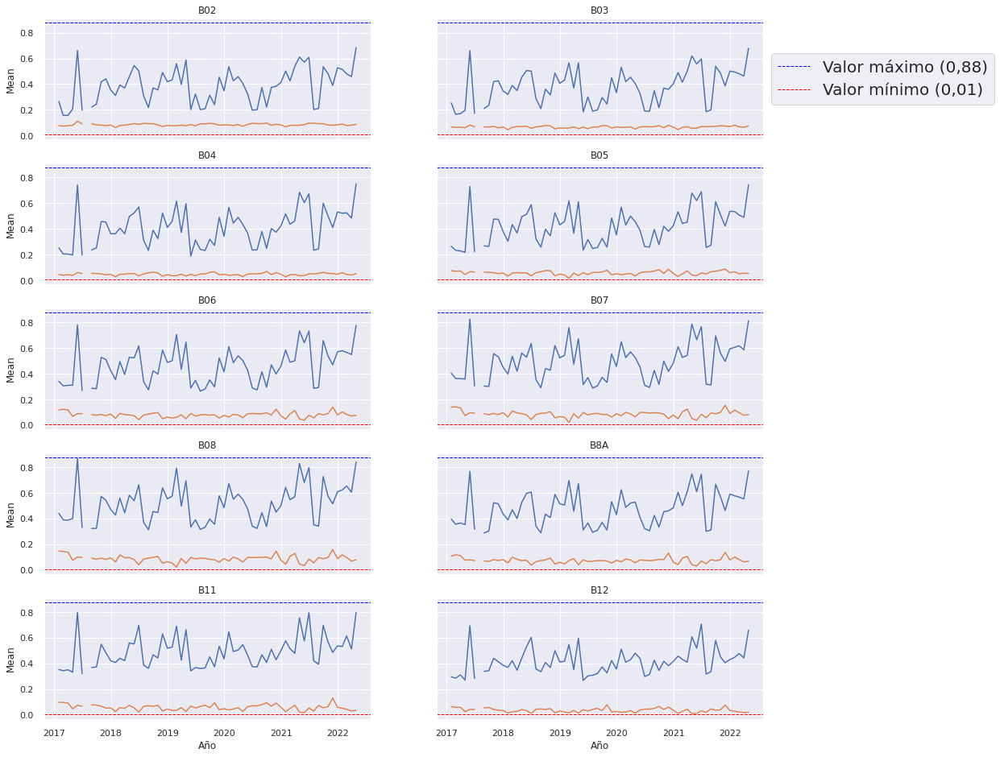

In [26]:
# Graficamos la dispersión de cada una de las bandas a lo largo del tiempo agrupando por mes (freq='M'). 
# Para facilitar la comparación se grafican todas las bandas en un mismo plot y se mantienen las escalas de ambos ejes
# Para facilitar la observación de la dispersión de valores, se grafican líneas segmentada para el valor máximo y mínimo observado  
MeanB02= df.groupby(pd.Grouper(key='date',freq='M')).B02_mean.agg([max, min])
MeanB03= df.groupby(pd.Grouper(key='date',freq='M')).B03_mean.agg([max, min])
MeanB04= df.groupby(pd.Grouper(key='date',freq='M')).B04_mean.agg([max, min])
MeanB05= df.groupby(pd.Grouper(key='date',freq='M')).B05_mean.agg([max, min])
MeanB06= df.groupby(pd.Grouper(key='date',freq='M')).B06_mean.agg([max, min])
MeanB07= df.groupby(pd.Grouper(key='date',freq='M')).B07_mean.agg([max, min])
MeanB08= df.groupby(pd.Grouper(key='date',freq='M')).B08_mean.agg([max, min])
MeanB8A= df.groupby(pd.Grouper(key='date',freq='M')).B8A_mean.agg([max, min])
MeanB11= df.groupby(pd.Grouper(key='date',freq='M')).B11_mean.agg([max, min])
MeanB12= df.groupby(pd.Grouper(key='date',freq='M')).B12_mean.agg([max, min])
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(16, 16), sharex=True, sharey=True)
ax[0, 0].plot(MeanB02)
ax[0, 1].plot(MeanB03)
ax[1, 0].plot(MeanB04)
ax[1, 1].plot(MeanB05)
ax[2, 0].plot(MeanB06)
ax[2, 1].plot(MeanB07)
ax[3, 0].plot(MeanB08)
ax[3, 1].plot(MeanB8A)
ax[4, 0].plot(MeanB11)
ax[4, 1].plot(MeanB12)
ax[0, 0].set_title("B02")
ax[0, 1].set_title("B03")
ax[1, 0].set_title("B04")
ax[1, 1].set_title("B05")
ax[2, 0].set_title("B06")
ax[2, 1].set_title("B07")
ax[3, 0].set_title("B08")
ax[3, 1].set_title("B8A")
ax[4, 0].set_title("B11")
ax[4, 1].set_title("B12")
ax[4, 0].set_xlabel("Año")
ax[4, 1].set_xlabel("Año")
ax[0, 0].set_ylabel("Mean")
ax[1, 0].set_ylabel("Mean")
ax[2, 0].set_ylabel("Mean")
ax[3, 0].set_ylabel("Mean")
ax[4, 0].set_ylabel("Mean")
ax[0, 0].axhline(y=0.88, color='blue', linestyle='--', linewidth=1)
ax[0, 0].axhline(y=0.01, color='red', linestyle='--', linewidth=1)
ax[0, 1].axhline(y=0.88, color='blue', linestyle='--', linewidth=1, label="Valor máximo (0,88)")
ax[0, 1].axhline(y=0.01, color='red', linestyle='--', linewidth=1, label="Valor mínimo (0,01)")
ax[1, 0].axhline(y=0.88, color='blue', linestyle='--', linewidth=1)
ax[1, 0].axhline(y=0.01, color='red', linestyle='--', linewidth=1)
ax[1, 1].axhline(y=0.88, color='blue', linestyle='--', linewidth=1)
ax[1, 1].axhline(y=0.01, color='red', linestyle='--', linewidth=1)
ax[2, 0].axhline(y=0.88, color='blue', linestyle='--', linewidth=1)
ax[2, 0].axhline(y=0.01, color='red', linestyle='--', linewidth=1)
ax[2, 1].axhline(y=0.88, color='blue', linestyle='--', linewidth=1)
ax[2, 1].axhline(y=0.01, color='red', linestyle='--', linewidth=1)
ax[3, 0].axhline(y=0.88, color='blue', linestyle='--', linewidth=1)
ax[3, 0].axhline(y=0.01, color='red', linestyle='--', linewidth=1)
ax[3, 1].axhline(y=0.88, color='blue', linestyle='--', linewidth=1)
ax[3, 1].axhline(y=0.01, color='red', linestyle='--', linewidth=1)
ax[4, 0].axhline(y=0.88, color='blue', linestyle='--', linewidth=1)
ax[4, 0].axhline(y=0.01, color='red', linestyle='--', linewidth=1)
ax[4, 1].axhline(y=0.88, color='blue', linestyle='--', linewidth=1)
ax[4, 1].axhline(y=0.01, color='red', linestyle='--', linewidth=1)
ax[0,1].legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=20)

##Series temporales
Como las observaciones se encuentran indexadas en el tiempo, este tipo de datos se conocen como **series de tiempo**. Elija alguno de los espacios verdes mas conocidos (Parque Sarmiento por ejemplo) y responda: 

- ¿Cual es el período de tiempo bajo análisis?

In [ ]:
print(df[df['name'] == 'Parque Sarmiento']['date'].min())
print(df[df['name'] == 'Parque Sarmiento']['date'].max())
Inicio = df[df['name'] == 'Parque Sarmiento']['date'].min()
Final = df[df['name'] == 'Parque Sarmiento']['date'].max()
print('El período de tiempo bajo análisis es de', str(Final - Inicio))

- Elija una banda y un indice (B02 y NDVI, por ejemplo) ambos parecen seguir alguna estacionalidad? Es decir, sus valores parecen "repetirse" cada cierto periodo? (Para este analisis considere utilizar la mediana de todas las mediciones {}_median).

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


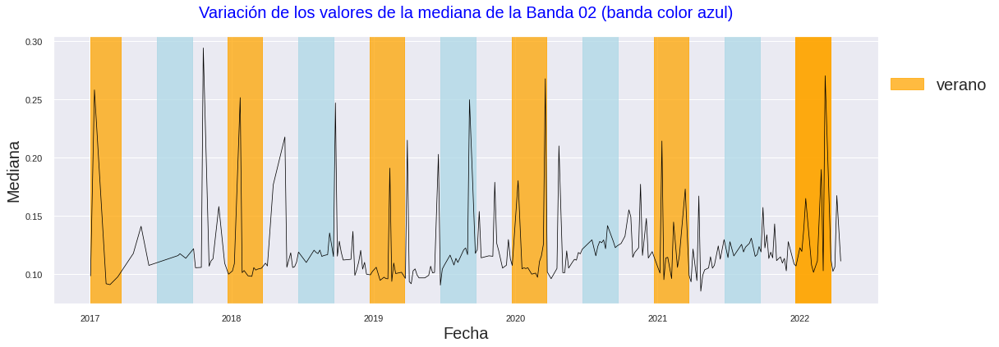

In [28]:
Sarmiento = df[df['name'] == 'Parque Sarmiento']
import matplotlib.dates as mdates # Esto sirve para manipular fechas en los gráficos
import datetime
fig, ax = plt.subplots(figsize=(18,6))
sns.lineplot(Sarmiento['date'], Sarmiento['B02_median'], color="black", linewidth=0.75)
yearlist = ['2017','2018','2019','2020','2021','2022']

for i in range(len(yearlist)):
  if yearlist[i] == '2017':
    ax.axvspan(mdates.date2num(datetime.datetime(2017,1,3)), mdates.date2num(datetime.datetime(2017,3,21)), 
               color="orange",label="verano", alpha=0.75)
  if yearlist[i] == '2022':
    ax.axvspan(mdates.date2num(datetime.datetime(2021,12,22)), mdates.date2num(datetime.datetime(2022,3,21)), 
               color="orange", alpha=0.75)
  else:
     ax.axvspan(mdates.date2num(datetime.datetime(int(yearlist[i]),12,22)), mdates.date2num(datetime.datetime(int(yearlist[i+1]),3,21))
           , color="orange", alpha=0.75)
     ax.axvspan(mdates.date2num(datetime.datetime(int(yearlist[i]),6,22)), mdates.date2num(datetime.datetime(int(yearlist[i]),9,21)), 
            color="lightblue", alpha=0.75) 

plt.xlabel("Fecha", fontsize= 20)
plt.ylabel("Mediana", fontsize= 20)
plt.title("Variación de los valores de la mediana de la Banda 02 (banda color azul)", fontsize= 20, color="blue", position=(0.5, 1.05))
plt.tight_layout
plt.style.use('seaborn-whitegrid')  
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 0.9), fontsize=20);

  **PARA LA GRÁFICA ANTERIOR ME FALTARÍA AGREGAR LEYENDA "INVIERNO"**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


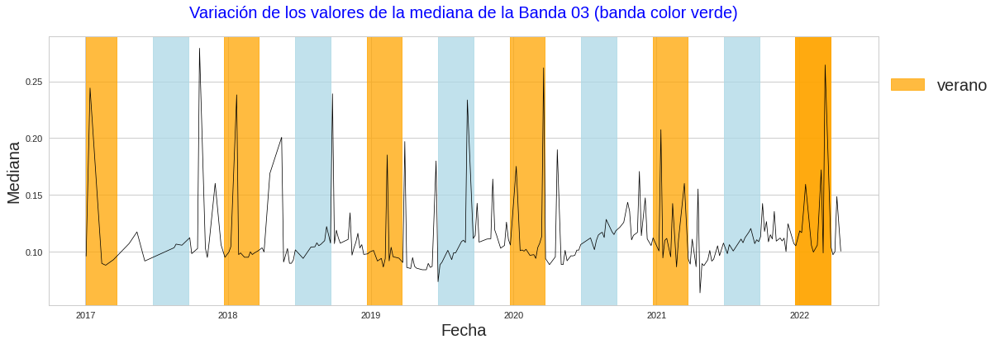

In [29]:
fig, ax = plt.subplots(figsize=(18,6))
sns.lineplot(Sarmiento['date'], Sarmiento['B03_median'], color="black", linewidth=0.75)
yearlist = ['2017','2018','2019','2020','2021','2022']

for i in range(len(yearlist)):
  if yearlist[i] == '2017':
    ax.axvspan(mdates.date2num(datetime.datetime(2017,1,3)), mdates.date2num(datetime.datetime(2017,3,21)), 
               color="orange",label="verano", alpha=0.75)
  if yearlist[i] == '2022':
    ax.axvspan(mdates.date2num(datetime.datetime(2021,12,22)), mdates.date2num(datetime.datetime(2022,3,21)), 
               color="orange", alpha=0.75)
  else:
     ax.axvspan(mdates.date2num(datetime.datetime(int(yearlist[i]),12,22)), mdates.date2num(datetime.datetime(int(yearlist[i+1]),3,21))
           , color="orange", alpha=0.75)
     ax.axvspan(mdates.date2num(datetime.datetime(int(yearlist[i]),6,22)), mdates.date2num(datetime.datetime(int(yearlist[i]),9,21)), 
            color="lightblue", alpha=0.75) 

plt.xlabel("Fecha", fontsize= 20)
plt.ylabel("Mediana", fontsize= 20)
plt.title("Variación de los valores de la mediana de la Banda 03 (banda color verde)", fontsize= 20, color="blue", position=(0.5, 1.05))
plt.tight_layout
plt.style.use('seaborn-whitegrid')  
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 0.9), fontsize=20);

- Seleccione un índice y grafique un boxplot para cada año. ¿Se mantiene inalterada en el tiempo la distribución? Que pasa si ese boxplot lo separa por estación (invierno,verano,otoño, primavera) y año son parecidas entre ellas en algun caso? Como se comportan año a año?

In [160]:
#Convertimos la fecha como un índice
#df = df.set_index('date')

In [132]:
df

,B02_min,B02_max,B02_mean,B02_median,B02_nodata,B02_range,B02_count,B03_min,B03_max,B03_mean,...,sipi_mean,sipi_median,sipi_nodata,sipi_range,sipi_count,raster,clouds_on_raster,osm_id,name,area_m2
date,,,,,,,,,,,,,,,,,,,,,
2017-01-03,0.0871,0.1421,0.102570,0.09650,0.0,0.0550,47,0.0768,0.1516,0.098885,...,0.924291,0.884216,0.0,0.453065,47,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,605976736,NaN,4650.710032
2017-01-03,0.0970,0.1936,0.118354,0.10660,0.0,0.0966,13,0.1006,0.1949,0.122154,...,0.979787,0.971875,0.0,0.247045,13,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559322368,NaN,1502.000513
2017-01-03,0.0992,0.1273,0.111805,0.11290,0.0,0.0281,19,0.1037,0.1369,0.117795,...,0.979928,0.973017,0.0,0.207006,19,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559322369,NaN,2004.192528
2017-01-03,0.0995,0.1933,0.118491,0.11355,0.0,0.0938,66,0.0993,0.1990,0.124512,...,0.983599,0.966202,0.0,0.258424,66,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559328111,NaN,6940.507640
2017-01-03,0.1059,0.1385,0.122453,0.12240,0.0,0.0326,47,0.1036,0.1580,0.132455,...,1.000021,0.993986,0.0,0.260419,47,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,0.0,559328112,NaN,4587.356048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-17,0.0990,0.1684,0.115990,0.11270,0.0,0.0694,31,0.0862,0.1627,0.107387,...,0.910244,0.892669,0.0,0.545993,31,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,307532496,NaN,3824.467794
2022-04-17,0.1145,0.3240,0.149746,0.13665,0.0,0.2095,80,0.0977,0.3363,0.149332,...,1.085096,1.084102,0.0,2.805242,80,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,307535460,Plaza Exodo Jujeño,7184.535857
2022-04-17,0.0993,0.1388,0.110870,0.10625,0.0,0.0395,10,0.0930,0.1473,0.106160,...,0.927010,0.914887,0.0,0.199024,10,S2A_MSIL1C_20220417T141741_N0400_R010_T20JLL_2...,0.0,307796387,NaN,1147.997645


In [157]:
serie1 = df.loc['2017-01-03':'2017-12-24']

In [158]:
ndvi_2017=serie1['ndvi_max']

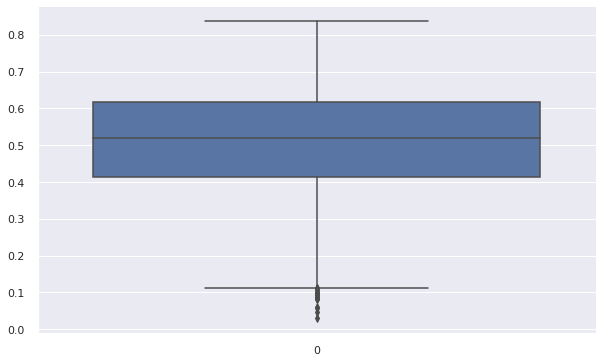

In [159]:
plt.figure(figsize=(10,6))
g = sns.boxplot(data=ndvi_2017)                  
sns.despine()

## Sobre el Trabajo Requerido

Se propone la elaboración de un _informe o reporte_ que deberá entregarse en formato html/pdf/md y deberá apuntar a un público técnico, 
pero sin conocimientos específicos en el tema (es decir nos deberiamos abstraer de conceptos tales como raster, vectores, etc).  

La estructura del reporte sugerida es:

- Introducción [1]
- Presentación del Dataset (el que consideren mas vistoso o demostrativo) [2]
- Variables de interés (relacionado al punto [3])
- Series temporales (relacionado al punto [4])
- Conclusiones ([5])

Cada parte del informe las deberian poder extraer de las respuestas o comentarios de los proximos puntos.

__NOTA__: Todos aquellos listados como __Punto Extra__ no son necesarios para el informe pero su resolución se considera un aporte positivo.

### Presentación/Slides (__Punto Extra__)

Se valorará la generacion de una presentación compacta (< 8 slides) en base a lo analizado, que permita responder:
- Utilidad del Monitoreo de espacios verdes
- Beneficios/Desventajas
- Limitaciones del enfoque via indices de imagenes satelitales y mitigaciones a esto
- Condiciones o criterios que hagan que un dado espacio sea monitoreable via imágenes satelitales

__NOTA__: Por presentacion, entendemos, google slides, ppt, beamer,las generadas a partir de las jupyter notebooks,etc.

## [1] Introducción 

Sobre porque consideran importante el monitoreo de espacios verdes (y otras razones que quieran sumar). Y que piensan descubrir a
partir del análisis y la visualizacion de los mismos (o que piensan que no vamos a poder hacer)

## [2] Presentación del Dataset

Sobre como entienden el dataset, como piensan que se generaron los valores dentro del dataset a partir de los datos crudos,etc.

## [3] Análisis Estadístico de Variables

Deberán realizar un análisis estadístico riguroso de variables que seleccionen por ser de su interés (entre 2 y 4), incluyendo en el set al menos una banda y un indice. 

Deberán responder preguntas como:

-   _Variables_: ¿Qué _tipo de variable_ es cada una? Parecen estar acotadas? (Puede ser interesante suplementar con alguna bibliografia extra respecto a que valores puede  tener un indice o banda) ¿Son fisicamente razonables?
-   _Outliers_: ¿Existen _outliers_ en las variables seleccionadas? (Note que en la presentación de los datos, esto parece estar presente en casi todos los casos)
-   _Valores Faltantes_: ¿Existen? ¿Es mejor descartarlos o completarlos con un valor particular? (Quizas le sirva responder la siguiente pregunta en primer lugar)
-   _Distribucion de Valores_: ¿Cómo es la _distribución_ de las variables en el dataset? ¿Se parecen a alguna distribucion que recuerde? Son todas de la misma distribución?
-   _Distribucion Condicionada_: ¿Cómo es la distribución de una variable (cualquiera que haya elegido) condicionada a la variable temporal por ejemplo? ¿Tiene sentido utilizar la dependencia temporal cuando estamos intentando completar valores faltantes?

En caso de calcular estadísticos, explicar por qué lo hicieron y que buscaban obtener al calcularlos. Utilizar los gráficos apropiados para mostrar el análisis realizado.  
Además:


-  ¿Existe _correlacion_ entre variables? ¿Entre cuales es mas "intensa"? -> Considere utilizar  [__pandas-profiling__](https://github.com/ydataai/pandas-profiling)
-  Analizar la dispersión de las bandas (para un estadistico, por ejemplo la media) a lo largo del tiempo. ¿La dispersión es la misma en todos los casos? ¿O existen bandas que "se dispersan" mas?

Utilizar gráficos que permitan visualizar de un modo simple las conclusiones.

## [4] Series temporales

Como las observaciones se encuentran indexadas en el tiempo, este tipo de datos se conocen como **series de tiempo**. Elija alguno de los espacios verdes mas conocidos (Parque Sarmiento por ejemplo) y responda: 

- ¿Cual es el período de tiempo bajo análisis?
- Elija una banda y un indice (B02 y NDVI, por ejemplo) ambos parecen seguir alguna estacionalidad? Es decir, sus valores parecen "repetirse" cada cierto periodo? (Para este analisis considere utilizar la mediana de todas las mediciones {}_median).
- Ahora extienda el analisis a todas las variables, son estacionales? Todas tienen el mismo tipo de estacionalidad? __Nota__: En este punto y etapa no se espera un criterio estricto de estacionalidad sino mostrar que bajo algun criterio (por ejemplo boxplots "similares" por temporada, etc) parecen serlo.
- Seleccione un índice y grafique un boxplot para cada año. ¿Se mantiene inalterada en el tiempo la distribución? Que pasa si ese boxplot lo separa por estación (invierno,verano,otoño, primavera) y año son parecidas entre ellas en algun caso? Como se comportan año a año?
- Tiene sentido calcular outliers para todo el tiempo de la serie o deberia segmentarse? Es decir, un outlier en otoño es lo mismo que en primavera o verano?
- Sobre datos faltantes, existe algun intervalo temporal en el cual esto parezca ser mas recurrente (observe [ab-initio-data-build](../data/ab-initio-dataset-build.md) # Imagenes CBA) ? 

    __Punto Extra__: replique la imágen _cantidad de imágenes por fecha y nubosidad_, se le ocurre alguna forma alternativa de representarlo?
- Sobre los outliers, elija alguna banda o indice y compute los outliers (bajo algun criterio que le parezca razonable), ahora contraste los mismos (o el rango de los mismos) con la representacion de los rasters ( descargables desde: [parches rbg/cloud-mask](https://drive.google.com/file/d/1VJnFvc9waDWPzm0i6UitKwlOSaQVwn_j/view?usp=sharing) ), su eleccion de outliers parece sostenerse? O esta desechando datos que podrian servir?
- __Punto Extra__: Explique el indice NDVI, y su aplicabilidad para observar la evolución de cultivos. ¿Esto nos serviria para monitorear plazas y parques?
- __Punto Extra__: Se le ocurre alguna forma de normalizar los datos para hacernos independientes de los años (pero si mantener la estacionalidad)? 
- __Punto Extra__: El tipo de sensor que estamos considerando esta afectado fuertemente por las condiciones luminicas, puede encontrar algún par de {imagenes, indices} que parezcan representar esta situación? Para ello deberia seleccionar imagenes cercanas temporalmente (misma semana o mes, sin nubes) y obtener sus indices. Podria concluir algo a partir de eso? O le hacen falta mas datos? (Respuesta preliminar: la informacion brindada parece ser insuficiente) 
- ¿Dado un indice, es capaz de encontrar algun rango temporal en el cual parezca romperse la estacionalidad? (Esto lo podria intentar contrastar con las imagenes en rgb para ello le recomendamos que elija un espacio verde extenso)
- Le parece que existen espacios verdes que no sean susceptibles de ser monitoreados via las bandas o indices? 

    __Punto Extra__: Podria generar condiciones o criterios (tamaño, reflectancia en alguna banda, etc) que nos indiquen si un dado espacio es monitoreable ( o no) via imágenes satelitales?


## [5] Conclusiones

Se considerará como positivo la capacidad de generar conclusiones o analisis que permitan construir nuevo conocimiento en base a los datos provistos.
Respecto a las conclusiones, se espera que a partir de los puntos [3] y [4] hayan podido conocer el dataset y tener una idea (linea de acción) para mitigar o atacar temas tales como:
- Outliers?
- Faltantes de datos?
- Todas las variables son relevantes?
- etc

No hay límites respecto a la extensión, pero se valorará el poder de síntesis y de comunicación, así como el uso de las herramientas pertinentes..